# NMF for music transcription 

In [104]:
%matplotlib inline
from pathlib import Path
import numpy as np, scipy, matplotlib.pyplot as plt, sklearn, urllib, IPython.display as ipd
import librosa, librosa.display
import math

In [105]:
x, sr = librosa.load('Piano.mf.Bb3.aiff', sr=44100)

In [106]:
ipd.Audio(x, rate=sr)

Compute the STFT:

In [107]:
# stft with default hop length and window size 
S = librosa.stft(x, n_fft = 5000)

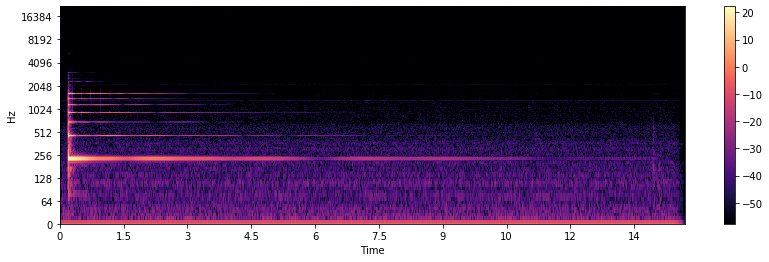

In [108]:
S_db = librosa.amplitude_to_db(abs(S))
plt.figure(figsize=(14, 4))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log', cmap = 'magma')
plt.colorbar()

## Decompose into harmonic and percussive parts of the STFT

In [109]:
# decompose the harmonic and percussive parts 
S_harmonic, S_percussive = librosa.decompose.hpss(S)

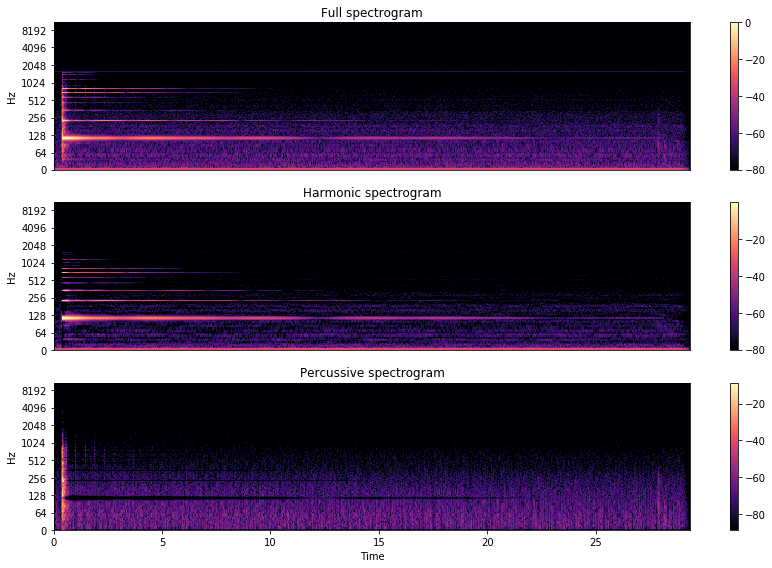

In [110]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(S))

plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(S), ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(S_harmonic), ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(S_percussive), ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

### NMF decomposition

We expect that there is one spectral template for the note played

In [111]:
# seperate the harmonic STFT into magnitude and phase
X, X_phase = librosa.magphase(S_harmonic)

# Here we set n_components to 7 which corresponds to the 
# number of pitch classes in the major scale 
n_components = 1

# NMF decomposition 
W, H = librosa.decompose.decompose(X, n_components=n_components, sort=True)

print(W.shape)
print(H.shape)

(2501, 1)
(1, 1265)


Let's display the spectral profiles:

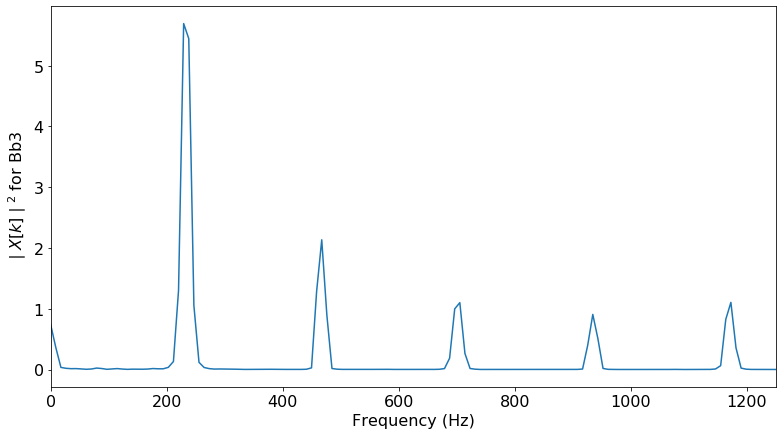

In [126]:
# show some components 
plt.figure(figsize=(13, 7))
# take the logarithm of each spectral component
freq_axis = np.arange(0,W[:,0].shape[0])*sr*0.5/W[:,0].shape[0]
plt.plot(freq_axis, W[:,0])
plt.xlim(0, W.shape[0]/2)
plt.ylabel('$\mid X[k] \mid^2$ for Bb3', fontsize=16)
plt.xlabel('Frequency (Hz)', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('spectrum-Bb3')

# Find the frequency of the components ? 

The components are simply DFT representations of each note that has been played

In [113]:
from __future__ import division

def parabolic(f, x):
    """Quadratic interpolation for estimating the true position of an
    inter-sample maximum when nearby samples are known.
    """
    # Requires real division.  Insert float() somewhere to force it?
    xv = 1/2 * (f[x-1] - f[x+1]) / (f[x-1] - 2 * f[x] + f[x+1]) + x
    yv = f[x] - 1/4 * (f[x-1] - f[x+1]) * (xv - x)
    return (xv, yv)

In [114]:
def freq_from_dft(dft):
    i = np.argmax(abs(dft))
    true_i = parabolic(np.log(dft),i)[0]
    
    return sr*true_i/len(dft)

In [115]:
# find the fundamental frequency of each component using parabolic interpolation 

for n in range(n_components):
    
    freq_est = freq_from_dft(W[:,n])
    print('component ',n, ': ',freq_est,'Hz')

component  0 :  466.7558509989281 Hz


Let's display the temporal activations, $\{h_1, ..., h_R\}$:

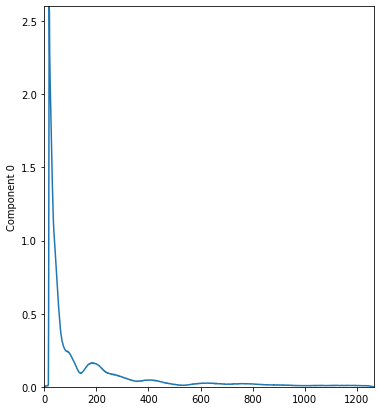

In [91]:
plt.figure(figsize=(13, 7))
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(H[n])
    plt.ylim(0, H.max())
    plt.xlim(0, H.shape[1])
    plt.ylabel('Component %d' % n)

Finally, re-create the individual components, and listen to them. To do this, we will reconstruct the magnitude spectrogram from the NMF outputs and use the phase spectrogram from the original signal.

In [92]:
for n in range(n_components):
    
    # Re-create the STFT of a single NMF component.
    Y = scipy.outer(W[:,n], H[n])*X_phase
    
    # Transform the STFT into the time domain.
    y = librosa.istft(Y)
    
    print('Component {}:'.format(n))
    ipd.display( ipd.Audio(y, rate=sr) )

C:\Users\olli\anaconda3\envs\ignetik-thesis\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: scipy.outer is deprecated and will be removed in SciPy 2.0.0, use numpy.outer instead
  after removing the cwd from sys.path.


Component 0:


Listen to the reconstructed full mix:

In [93]:
# Re-create the STFT from all NMF components.
Y = np.dot(W, H)*X_phase

# Transform the STFT into the time domain.
reconstructed_signal = librosa.istft(Y, length=len(x))
ipd.Audio(reconstructed_signal, rate=sr)

Listen to the residual:

In [94]:
residual = x - reconstructed_signal
residual[0] = 1 # hack to prevent automatic gain scaling
ipd.Audio(residual, rate=sr)